In [1]:
#!pip install pandas=='1.5.2'

In [2]:
#!pip install scikit-learn -U

In [3]:
#!pip install statsmodels -U

In [4]:
#!pip list

In [1]:
import numpy as np
import yfinance as yf
import pandas as pd
from pandas_datareader import data as pdr
import datetime as dt
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
import pickle
import time


yf.pdr_override()

# Getting financial data for all S&P500 tickers

In [64]:
# get list of tickers
tickers = pd.read_csv('SP500.csv')['Symbol']

In [65]:
# get financial data and save into pickle

# d = {}

# try: 
#     for ticker in tickers:
#         time.sleep(np.random.uniform(0, 3))
#         print(ticker)
#         t = yf.Ticker(ticker)
#         d[ticker] = {}
#         d[ticker]['income_statement'] = t.quarterly_financials
#         d[ticker]['balance_sheet'] = t.quarterly_balance_sheet
#         d[ticker]['cashflow'] = t.quarterly_cashflow
#         d[ticker]['earnings'] = t.quarterly_earnings

# finally:
#     with open('financials.pkl', 'wb') as f:
#        pickle.dump(d, f)

In [2]:
# load in pickle
with open('qtrly_financials.pkl', 'rb') as f:
    data = pickle.load(f)

## Check for missing data and fix it

In [3]:
# check which tickers have no financial data loaded in
for ticker, dfs in data.items():
    if len(dfs['cashflow'].index) == 0:
        print(ticker)

In [ ]:
# fix BRK.B and BF.B

# del data['BRK.B']
# del data['BF.B']

# brk = yf.Ticker('BRK-B')
# data['BRK-B'] = {}
# data['BRK-B']['income_statement'] = brk.quarterly_financials
# data['BRK-B']['balance_sheet'] = brk.quarterly_balance_sheet
# data['BRK-B']['cashflow'] = brk.quarterly_cashflow
# data['BRK-B']['earnings'] = brk.quarterly_earnings

# bf = yf.Ticker('BF-B')
# data['BF-B'] = {}
# data['BF-B']['income_statement'] = bf.quarterly_financials
# data['BF-B']['balance_sheet'] = bf.quarterly_balance_sheet
# data['BF-B']['cashflow'] = bf.quarterly_cashflow
# data['BF-B']['earnings'] = bf.quarterly_earnings

# with open('qtrly_financials.pkl', 'wb') as f:
#    pickle.dump(data, f)

In [4]:
# get missing data
for ticker in ['GPC', 'MKC', 'PWR', 'GEN', 'UDR']:
    time.sleep(np.random.uniform(0, 3))
    print(ticker)
    t = yf.Ticker(ticker)
    data[ticker] = {}
    data[ticker]['income_statement'] = t.quarterly_financials
    data[ticker]['balance_sheet'] = t.quarterly_balance_sheet
    data[ticker]['cashflow'] = t.quarterly_cashflow
    data[ticker]['earnings'] = t.quarterly_earnings

GPC
MKC
PWR
GEN
UDR


In [5]:
# check which tickers have no financial data loaded in
for ticker, dfs in data.items():
    if len(dfs['cashflow'].index) == 0:
        print(ticker)
# all good now

In [6]:
# with open('qtrly_financials.pkl', 'wb') as f:
#    pickle.dump(data, f)

# Get index fields that are included in all tickers

- used to make data matrix

In [3]:
income_statement_set = set(data['AAPL']['income_statement'].index)
for ticker, dfs in data.items():
    income_statement_set = income_statement_set.intersection(dfs['income_statement'].index)
    
income_statement_set

{'Cost Of Revenue',
 'Discontinued Operations',
 'Ebit',
 'Effect Of Accounting Charges',
 'Extraordinary Items',
 'Gross Profit',
 'Income Before Tax',
 'Income Tax Expense',
 'Interest Expense',
 'Minority Interest',
 'Net Income',
 'Net Income Applicable To Common Shares',
 'Net Income From Continuing Ops',
 'Non Recurring',
 'Operating Income',
 'Other Items',
 'Other Operating Expenses',
 'Research Development',
 'Selling General Administrative',
 'Total Operating Expenses',
 'Total Other Income Expense Net',
 'Total Revenue'}

In [4]:
for field in income_statement_set:
    none = 0
    for ticker, dfs in data.items():
        x = dfs['income_statement'].loc[field][1]
        if pd.isna(x):
            none += 1
    print(field + ': ' + str(none))

Effect Of Accounting Charges: 503
Non Recurring: 503
Total Other Income Expense Net: 0
Other Items: 503
Cost Of Revenue: 0
Total Revenue: 0
Operating Income: 0
Net Income Applicable To Common Shares: 0
Income Before Tax: 0
Net Income: 0
Total Operating Expenses: 0
Gross Profit: 0
Interest Expense: 47
Selling General Administrative: 17
Net Income From Continuing Ops: 0
Income Tax Expense: 0
Other Operating Expenses: 314
Research Development: 352
Minority Interest: 226
Extraordinary Items: 503
Ebit: 0
Discontinued Operations: 463


In [5]:
balance_sheet_set = set(data['AAPL']['balance_sheet'].index)
for ticker, dfs in data.items():
    balance_sheet_set = balance_sheet_set.intersection(dfs['balance_sheet'].index)
    
balance_sheet_set

{'Cash',
 'Net Tangible Assets',
 'Total Assets',
 'Total Current Assets',
 'Total Current Liabilities',
 'Total Liab',
 'Total Stockholder Equity'}

In [6]:
for field in balance_sheet_set:
    none = 0
    for ticker, dfs in data.items():
        x = dfs['balance_sheet'].loc[field][1]
        if pd.isna(x):
            none += 1
    print(field + ': ' + str(none))

Total Liab: 57
Total Current Liabilities: 47
Total Current Assets: 44
Total Stockholder Equity: 52
Cash: 52
Total Assets: 57
Net Tangible Assets: 46


In [7]:
cashflow_set = set(data['AAPL']['cashflow'].index)
for ticker, dfs in data.items():
    cashflow_set = cashflow_set.intersection(dfs['cashflow'].index)

cashflow_set

{'Change In Cash',
 'Change To Liabilities',
 'Change To Netincome',
 'Net Income',
 'Total Cash From Financing Activities',
 'Total Cash From Operating Activities',
 'Total Cashflows From Investing Activities'}

In [8]:
for field in cashflow_set:
    none = 0
    for ticker, dfs in data.items():
        x = dfs['cashflow'].loc[field][1]
        if pd.isna(x):
            none += 1
    print(field + ': ' + str(none))

Total Cashflows From Investing Activities: 2
Change To Liabilities: 0
Total Cash From Financing Activities: 2
Change In Cash: 2
Change To Netincome: 2
Net Income: 0
Total Cash From Operating Activities: 2


In [9]:
income_statement_fields = [
    'Cost Of Revenue',
    'Ebit',
    'Gross Profit',
    'Income Before Tax',
    'Income Tax Expense',
    'Interest Expense',
    'Minority Interest',
    'Net Income',
    'Net Income Applicable To Common Shares',
    'Net Income From Continuing Ops',
    'Operating Income',
    'Research Development',
    'Selling General Administrative',
    'Total Operating Expenses',
    'Total Other Income Expense Net',
    'Total Revenue']

balance_sheet_fields = [
    'Cash',
    'Net Tangible Assets',
    'Total Assets',
    'Total Current Assets',
    'Total Current Liabilities',
    'Total Liab',
    'Total Stockholder Equity'
]

cashflow_fields = [
    'Change In Cash',
    'Change To Liabilities',
    'Change To Netincome',
#     'Net Income',
    'Total Cash From Financing Activities',
    'Total Cash From Operating Activities',
    'Total Cashflows From Investing Activities'
]

# Get pricing data

In [10]:
# # prices = pdr.get_data_yahoo(df.index.to_list(), start='2021-05-01')
# prices = pd.read_csv('SP500-prices.csv', header=[0, 1], index_col=0)

In [13]:
# daily_returns = prices['Adj Close'].pct_change(1)
# daily_returns = daily_returns.iloc[1:]
# daily_returns.dropna(axis=1, inplace=True)
# daily_returns.index = pd.to_datetime(daily_returns.index)
# daily_returns.head()

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACGL,ACN,...,WYNN,XEL,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS
Date,,,,,,,,,,,,,,,,,,,,,
2016-01-05,-0.003440,-0.009533,-0.006831,-0.025059,-0.004166,0.014626,-0.002816,-0.000233,0.003631,0.005205,...,0.018904,0.010084,0.008521,0.020388,-0.000277,-0.002493,0.020823,-0.025117,-0.010857,0.015655
2016-01-06,0.004439,0.017522,-0.026455,-0.019570,0.000174,-0.015286,0.003529,-0.008387,0.001592,-0.001954,...,-0.051805,0.010538,-0.008321,-0.014486,-0.012476,-0.007080,0.004330,-0.039957,-0.029145,0.000208
2016-01-07,-0.042475,-0.018918,0.011073,-0.042205,-0.002962,-0.031932,-0.039625,-0.023966,-0.001011,-0.029366,...,-0.094070,0.003842,-0.016006,-0.008785,-0.025828,-0.034116,-0.022993,-0.045316,-0.030019,-0.030404
2016-01-08,-0.010513,-0.001978,-0.021971,0.005288,-0.027268,-0.005785,0.032471,-0.020944,-0.010414,-0.009681,...,-0.040704,-0.010935,-0.020202,-0.028635,-0.009510,-0.013608,-0.004217,-0.002693,-0.011254,-0.014605
2016-01-11,-0.016844,0.017587,0.010236,0.016192,-0.031806,-0.039812,0.004966,0.001475,-0.002046,0.010489,...,-0.016453,0.008015,-0.013389,-0.019477,-0.008438,-0.001761,-0.017233,-0.006582,-0.019919,-0.028335


In [179]:
# set(df.index.to_list()) - set(daily_returns.columns)

{'CEG', 'OGN'}

In [180]:
# missing_prices = pdr.get_data_yahoo(list(set(df.index.to_list()) - set(daily_returns.columns)), start='2021-05-01')

[*********************100%***********************]  2 of 2 completed


In [181]:
# # replace price before ipo with ipo price
# missing_prices.loc[missing_prices['Adj Close']['CEG'].isna(), ('Adj Close', 'CEG')] =\
#     missing_prices['Adj Close']['CEG'].loc[~missing_prices['Adj Close']['CEG'].isna()][0]

In [182]:
# missing_daily_returns = missing_prices['Adj Close'].pct_change(1)
# missing_daily_returns = missing_daily_returns.iloc[1:]
# missing_daily_returns.dropna(axis=1, inplace=True)
# missing_daily_returns.index = pd.to_datetime(missing_daily_returns.index)
# missing_daily_returns.head()

,CEG,OGN
Date,,
2021-05-17,0.0,0.025564
2021-05-18,0.0,0.099707
2021-05-19,0.0,0.000000
2021-05-20,0.0,0.006667
2021-05-21,0.0,-0.003974


In [183]:
# all_daily_returns = pd.concat([daily_returns, missing_daily_returns], axis=1).fillna(0)
# all_daily_returns

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACGL,ACN,...,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2021-05-04,-0.017194,-0.024146,0.011345,-0.035385,-0.006802,0.016641,-0.011794,-0.016648,0.002990,-0.001951,...,0.006290,0.013821,0.038979,-0.005084,-0.028155,-0.017597,0.027400,-0.008388,0.000000,0.000000
2021-05-05,0.018869,0.007003,-0.006564,0.001955,0.016506,-0.055860,-0.013803,0.008252,-0.001739,-0.007133,...,0.030073,-0.019724,0.012160,0.014409,0.003585,0.025073,0.014816,0.000518,0.000000,0.000000
2021-05-06,-0.007273,-0.003709,0.006657,0.012803,0.002591,-0.010015,-0.016856,0.002363,-0.010450,0.005665,...,0.009513,-0.002959,0.011844,0.001652,-0.001844,-0.022822,0.016489,-0.036466,0.000000,0.000000
2021-05-07,0.011329,0.023732,0.001518,0.005327,-0.002843,0.027459,0.003686,0.001347,0.025647,0.001271,...,0.014297,0.016026,0.004968,-0.000495,-0.004272,0.036423,0.001521,0.024057,0.000000,0.000000
2021-05-10,-0.015160,0.000000,0.020150,-0.025805,0.004061,0.019775,-0.047471,-0.000084,-0.021329,-0.003156,...,0.002403,0.009493,0.003855,0.005692,-0.003131,-0.009292,-0.005905,-0.002215,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-18,0.012116,0.007168,-0.005462,0.003782,0.018533,0.019381,0.001141,0.012773,0.019805,-0.002229,...,-0.008668,0.014337,0.016608,0.014987,0.017570,0.003881,-0.001576,0.014206,0.036091,0.020067
2022-11-21,-0.007182,-0.014235,0.005017,-0.021680,0.013744,-0.010494,-0.001776,0.000096,-0.008843,0.001815,...,-0.009904,-0.017025,-0.003027,-0.004735,0.003857,0.003514,0.002565,0.011604,0.000965,0.013115
2022-11-22,0.080750,0.009386,0.008837,0.014661,0.017058,0.027511,0.003664,0.009530,0.010847,0.020452,...,0.028927,-0.007516,0.005268,0.007418,0.006985,0.015759,0.008856,0.008824,0.030838,0.004450


In [14]:
# all_daily_returns.to_csv('SP500-returns.csv')

NameError: name 'all_daily_returns' is not defined

In [11]:
all_daily_returns = pd.read_csv('SP500-returns.csv', index_col=0)
all_daily_returns.index = pd.to_datetime(all_daily_returns.index)

In [12]:
all_daily_returns

,A,AAL,AAP,AAPL,ABBV,ABC,ABMD,ABT,ACGL,ACN,...,XOM,XRAY,XYL,YUM,ZBH,ZBRA,ZION,ZTS,CEG,OGN
Date,,,,,,,,,,,,,,,,,,,,,
2021-05-04,-0.017194,-0.024146,0.011345,-0.035385,-0.006802,0.016641,-0.011794,-0.016648,0.002990,-0.001951,...,0.006290,0.013821,0.038979,-0.005084,-0.028155,-0.017597,0.027400,-0.008388,0.000000,0.000000
2021-05-05,0.018869,0.007003,-0.006564,0.001955,0.016506,-0.055860,-0.013803,0.008252,-0.001739,-0.007133,...,0.030073,-0.019724,0.012160,0.014409,0.003585,0.025073,0.014816,0.000518,0.000000,0.000000
2021-05-06,-0.007273,-0.003709,0.006657,0.012803,0.002591,-0.010015,-0.016856,0.002363,-0.010450,0.005665,...,0.009513,-0.002959,0.011844,0.001652,-0.001844,-0.022822,0.016489,-0.036466,0.000000,0.000000
2021-05-07,0.011329,0.023732,0.001518,0.005327,-0.002843,0.027459,0.003686,0.001347,0.025647,0.001271,...,0.014297,0.016026,0.004968,-0.000495,-0.004272,0.036423,0.001521,0.024057,0.000000,0.000000
2021-05-10,-0.015160,0.000000,0.020150,-0.025805,0.004061,0.019775,-0.047471,-0.000084,-0.021329,-0.003156,...,0.002403,0.009493,0.003855,0.005692,-0.003131,-0.009292,-0.005905,-0.002215,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-18,0.012116,0.007168,-0.005462,0.003782,0.018533,0.019381,0.001141,0.012773,0.019805,-0.002229,...,-0.008668,0.014337,0.016608,0.014987,0.017570,0.003881,-0.001576,0.014206,0.036091,0.020067
2022-11-21,-0.007182,-0.014235,0.005017,-0.021680,0.013744,-0.010494,-0.001776,0.000096,-0.008843,0.001815,...,-0.009904,-0.017025,-0.003027,-0.004735,0.003857,0.003514,0.002565,0.011604,0.000965,0.013115
2022-11-22,0.080750,0.009386,0.008837,0.014661,0.017058,0.027511,0.003664,0.009530,0.010847,0.020452,...,0.028927,-0.007516,0.005268,0.007418,0.006985,0.015759,0.008856,0.008824,0.030838,0.004450


# Creating data matrix and doing PCA on single qtr data (2021 Q4)

In [13]:
df = pd.DataFrame(columns=income_statement_fields+balance_sheet_fields+cashflow_fields, index=data.keys())
qtr_dates = {}

for ticker, dfs in data.items():
    date = dfs['cashflow'].columns[np.argmin(abs(pd.to_datetime('2021-12-31') - dfs['cashflow'].columns))]
    qtr_dates[ticker] = date
    df.loc[ticker] = pd.concat([
        dfs['income_statement'].loc[income_statement_fields, date],
        dfs['balance_sheet'].loc[balance_sheet_fields, date],
        dfs['cashflow'].loc[cashflow_fields, date]]).to_dict()
    
df.fillna(0, inplace=True)
# stadard scale data
df = (df - df.mean()) / df.std() 
df

,Cost Of Revenue,Ebit,Gross Profit,Income Before Tax,Income Tax Expense,Interest Expense,Minority Interest,Net Income,Net Income Applicable To Common Shares,Net Income From Continuing Ops,...,Total Current Assets,Total Current Liabilities,Total Liab,Total Stockholder Equity,Change In Cash,Change To Liabilities,Change To Netincome,Total Cash From Financing Activities,Total Cash From Operating Activities,Total Cashflows From Investing Activities
AAPL,6.026637,11.399694,8.049116,10.707584,9.884791,-3.411910,-0.310222,10.770138,10.792399,10.725336,...,0.988181,0.480769,0.928677,1.364748,0.366415,12.160200,1.410277,-3.663154,8.301415,-2.229387
MSFT,1.138593,5.958453,4.987154,5.694477,5.470755,-2.407316,-0.310222,5.682523,5.695311,5.659665,...,1.155193,0.163639,0.428908,3.611904,0.188487,-2.656437,0.824416,-1.553354,2.347853,0.046273
AMZN,7.243783,0.645600,8.101630,3.665248,0.629355,-2.180846,-0.310222,4.258055,4.268191,4.241341,...,1.055085,0.456743,0.824151,3.056608,0.873834,5.253507,-5.109771,-0.394158,3.741770,-1.692487
GOOGL,2.624043,5.856081,6.177192,6.199643,5.486183,-0.061326,-0.310222,6.284442,6.298352,6.258988,...,1.265997,0.103639,0.146815,5.949556,-0.405499,0.766526,1.394549,-2.143649,4.263710,-1.454338
GOOG,2.624043,5.856081,6.177192,6.199643,5.486183,-0.061326,-0.310222,6.284442,6.298352,6.258988,...,1.265997,0.103639,0.146815,5.949556,-0.405499,0.766526,1.394549,-2.143649,4.263710,-1.454338
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VNO,-0.414445,-0.307433,-0.439872,-0.321727,-0.299344,0.301820,0.323252,-0.326278,-0.329866,-0.321766,...,-0.205464,-0.184320,-0.231542,-0.341530,-0.062028,-0.164541,0.060850,-0.052613,-0.253838,0.201783
DVA,-0.242295,-0.223635,-0.340308,-0.248664,-0.213789,0.207475,0.747432,-0.274950,-0.273253,-0.252329,...,-0.202722,-0.176336,-0.213363,-0.451196,-0.096684,-0.149773,0.092088,-0.090774,-0.208720,0.171811
NWS,-0.314697,-0.213528,-0.253166,-0.236333,-0.162117,0.496137,0.320911,-0.259709,-0.257984,-0.248316,...,-0.191358,-0.172559,-0.242747,-0.256593,-0.002553,-0.161374,0.105306,-0.004497,-0.239488,0.199608
BRK-B,1.612643,13.728503,7.338458,12.772151,13.655468,-5.130754,5.405987,12.378677,12.403933,12.407400,...,1.424370,0.045336,1.450607,12.444312,2.532567,-1.164018,-18.635244,-0.921705,1.122724,2.858986


In [14]:
def pca_svd(X):
    # already standardized
#     X = (X - X.mean(axis=0)) / X.std(axis=0)
    
    # calculate SVD
    U, s, Vt = np.linalg.svd(X, full_matrices=False)
    
    return Vt.T, s

In [15]:
pca, s = pca_svd(df)

In [16]:
# variances explained by each principle component
variances = s**2 / sum(s**2)
v = 0
for i in range(1, len(variances)+1):
    v += variances[i-1]
    print('variance explained by pc' + str(i) + ': ' + str(round(variances[i-1], 3)) + ' | ' + str(round(v, 3)))

variance explained by pc1: 0.44 | 0.44
variance explained by pc2: 0.181 | 0.621
variance explained by pc3: 0.09 | 0.711
variance explained by pc4: 0.064 | 0.775
variance explained by pc5: 0.057 | 0.832
variance explained by pc6: 0.04 | 0.872
variance explained by pc7: 0.027 | 0.899
variance explained by pc8: 0.025 | 0.924
variance explained by pc9: 0.019 | 0.943
variance explained by pc10: 0.015 | 0.957
variance explained by pc11: 0.011 | 0.969
variance explained by pc12: 0.008 | 0.977
variance explained by pc13: 0.007 | 0.984
variance explained by pc14: 0.005 | 0.99
variance explained by pc15: 0.004 | 0.993
variance explained by pc16: 0.003 | 0.996
variance explained by pc17: 0.002 | 0.998
variance explained by pc18: 0.001 | 0.999
variance explained by pc19: 0.0 | 0.999
variance explained by pc20: 0.0 | 1.0
variance explained by pc21: 0.0 | 1.0
variance explained by pc22: 0.0 | 1.0
variance explained by pc23: 0.0 | 1.0
variance explained by pc24: 0.0 | 1.0
variance explained by pc25: 

In [23]:
# !pip install plotly

DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.3/15.3 MB 10.0 MB/s eta 0:00:0000:0100:01
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
  DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near future. If you are using a Homebrew or Linuxbrew Python, please see discussion at https://github.com/Homebrew/homebrew-core/issues/76621
DEPRECATION: Configuring installation scheme with distutils config files is deprecated and will no longer work in the near fu

## visualizing first 2 principal components

In [17]:
import plotly.express as px

config = {
  'toImageButtonOptions': {
    'format': 'jpeg', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    'height': 700,
    'width': 1000,
    'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
  }
}

pc1 = df @ pca[:, 0]
pc2 = df @ pca[:, 1]

fig = px.scatter(x=pc1, y=pc2, color=df.index)

for i, feature in enumerate(df.columns):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=pca[i,0]*s[0],
        y1=pca[i,1]*s[1]
    )
    fig.add_annotation(
        x=pca[i,0]*s[0],
        y=pca[i,1]*s[1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        font={'size': 10}
    )
    
for i, ticker in enumerate(df.index):
    fig.add_annotation(
        x=pc1[i],
        y=pc2[i],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=ticker,
        font={'size': 10}
    )

fig.show(config=config)

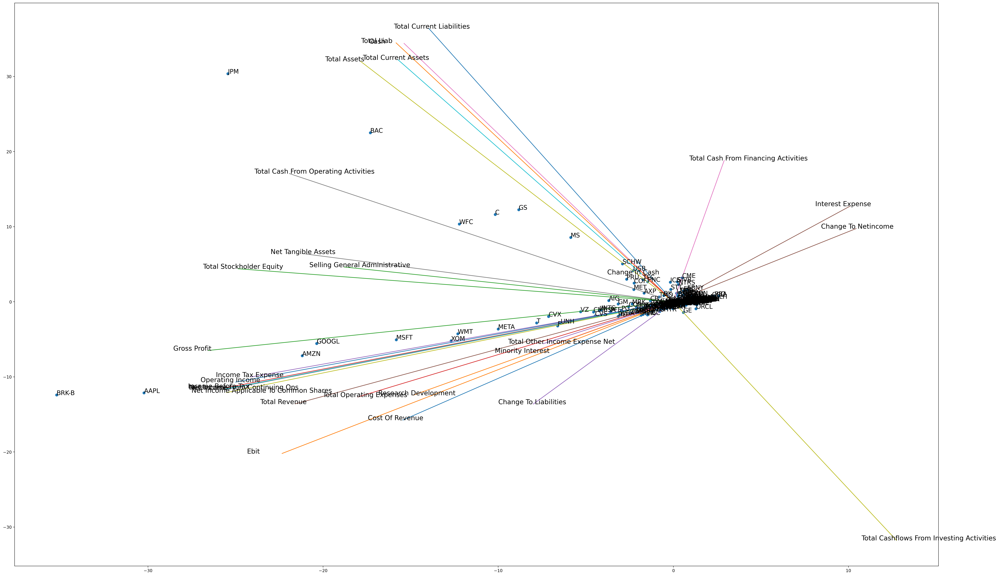

In [21]:
# pc1 = df @ pca[:, 0]
# pc2 = df @ pca[:, 1]

# fig, ax = plt.subplots(figsize=(40, 25), dpi=200)
# ax.scatter(pc1, pc2)

# for i, ticker in enumerate(df.index):
#     ax.annotate(ticker, (pc1[i], pc2[i]), fontsize=15)
    
# ax.plot([np.zeros(len(pca)), pca[:,0]*100], [np.zeros(len(pca)), pca[:,1]*100])

# for i, field in enumerate(df.columns):
#     ax.annotate(field, (pca[i,0]*100-2, pca[i,1]*100), fontsize=16)

# plt.show()
# # plt.savefig("image.png",dpi=300)

In [213]:
# pc1 = df @ pca[:, 0]
# pc2 = df @ pca[:, 1]

# fig, ax = plt.subplots(figsize=(40, 25), dpi=200)
# ax.scatter(pc1, pc2)

# for i, ticker in enumerate(df.index):
#     ax.annotate(ticker, (pc1[i], pc2[i]), fontsize=15)
    
# ax.plot([np.zeros(len(pca)), pca[:,0]*100], [np.zeros(len(pca)), pca[:,1]*100])

# for i, field in enumerate(df.columns):
#     ax.annotate(field, (pca[i,0]*20-2, pca[i,1]*20), fontsize=16)
    
# plt.xlim([-5, 5])
# plt.ylim([-5, 5])

# plt.show()
# # plt.savefig("image.png",dpi=300)

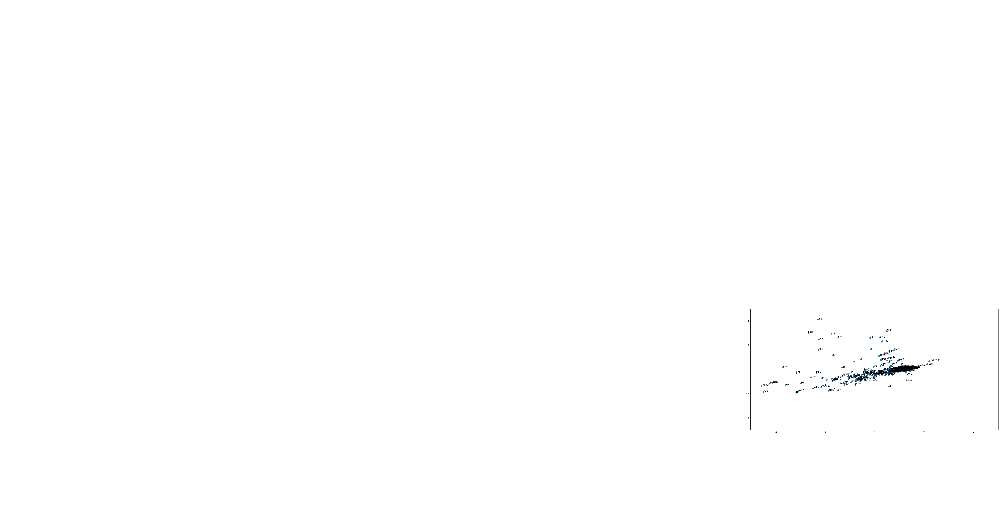

In [197]:
# pc1 = df @ pca[:, 0]
# pc2 = df @ pca[:, 1]

# fig, ax = plt.subplots(figsize=(20, 10), dpi=150)
# ax.scatter(pc1, pc2)

# plt.xlim([-5, 5])
# plt.ylim([-5, 5])

# for i, ticker in enumerate(df.index):
#     ax.annotate(ticker, (pc1[i], pc2[i]), fontsize=10)

# plt.show()
# #plt.savefig("image.png",bbox_inches='tight',dpi=150)

In [104]:
# weights of first principle component
pd.DataFrame(sorted(pca[:, 0], reverse=True), index=df.columns[np.argsort(-pca[:, 0])])

,0
Total Cashflows From Investing Activities,0.127428
Change To Netincome,0.104361
Interest Expense,0.101056
Total Cash From Financing Activities,0.029027
Change In Cash,-0.017745
Total Other Income Expense Net,-0.074413
Change To Liabilities,-0.079984
Minority Interest,-0.081939
Total Current Liabilities,-0.139609
Research Development,-0.148458


## Regressing financial data against same qtr performance

In [ ]:
pca, s = pca_svd(df)

In [93]:
# get performance for the same qtr of the financial data
returns = {}

for ticker, end_date in qtr_dates.items():
    start_date = end_date - relativedelta(months=3)
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [94]:
dmatrix = df @ pca[:, 0:7]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(7), ['pc'+str(i+1) for i in range(7)])), inplace=True)

In [95]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(7)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     1.884
Date:                Wed, 30 Nov 2022   Prob (F-statistic):             0.0702
Time:                        01:44:02   Log-Likelihood:                 323.42
No. Observations:                 503   AIC:                            -630.8
Df Residuals:                     495   BIC:                            -597.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0762      0.006    188.230      0.000       1.065       1.087
pc1            0.0002      0.002      0.136      0.892      -0.003       0.003
pc2           -0.0045      0.002     -1.796      0.073      -0.009       0.000
pc3           -0.0060      0.004     -1.702      0.089      -0.013       0.001
pc4           -0.0108      0.004     -2.566      0.011      -0.019      -0.003
pc5           -0.0009      0.004     -0.191      0.849      -0.010       0.008
pc6            0.0010      0.005      0.181      0.857      -0.009       0.011
pc7            0.0040      0.006      0.627      0.531      -0.009       0.017
==============================================================================
Omnibus:                       15.974   Durbin-Watson:                   1.939
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               28.544
Skew:                           0.185   Prob(JB):                     6.33e-07
Kurtosis:                       4.107   Cond. No.                         4.01
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### dropping "outlier" stocs

In [97]:
sort_idx = np.argsort(-np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1))

drop = pd.DataFrame(np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1)[sort_idx], index=dmatrix.index[sort_idx])[0] > 1

In [98]:
drop.index[drop]

Index(['JPM', 'BRK-B', 'AAPL', 'BAC', 'AMZN', 'GOOGL', 'GOOG', 'MSFT', 'WFC',
       'C',
       ...
       'NUE', 'BSX', 'HAL', 'WY', 'CL', 'ORLY', 'IPG', 'GPC', 'APA', 'URI'],
      dtype='object', length=341)

In [99]:
pca, s = pca_svd(df.drop(index=drop.index[drop]))

In [100]:
dmatrix = df.drop(index=drop.index[drop]) @ pca[:, 0:7]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(7), ['pc'+str(i+1) for i in range(7)])), inplace=True)

In [101]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(7)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.106
Model:                            OLS   Adj. R-squared:                  0.065
Method:                 Least Squares   F-statistic:                     2.607
Date:                Wed, 30 Nov 2022   Prob (F-statistic):             0.0143
Time:                        01:44:16   Log-Likelihood:                 121.26
No. Observations:                 162   AIC:                            -226.5
Df Residuals:                     154   BIC:                            -201.8
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0555      0.013     83.787      0.000       1.031       1.080
pc1            0.0244      0.012      2.059      0.041       0.001       0.048
pc2           -0.0380      0.013     -2.978      0.003      -0.063      -0.013
pc3           -0.0035      0.016     -0.220      0.826      -0.035       0.028
pc4            0.0085      0.016      0.520      0.604      -0.024       0.041
pc5           -0.0418      0.017     -2.403      0.017      -0.076      -0.007
pc6           -0.0115      0.021     -0.559      0.577      -0.052       0.029
pc7           -0.0174      0.021     -0.840      0.402      -0.058       0.023
==============================================================================
Omnibus:                        6.389   Durbin-Watson:                   2.038
Prob(Omnibus):                  0.041   Jarque-Bera (JB):                6.000
Skew:                          -0.445   Prob(JB):                       0.0498
Kurtosis:                       3.309   Cond. No.                         2.87
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [108]:
# # variances explained by each principle component
# variances = s**2 / sum(s**2)
# v = 0
# for i in range(1, len(variances)+1):
#     v += variances[i-1]
#     print('variance explained by pc' + str(i) + ': ' + str(round(variances[i-1], 3)) + ' | ' + str(round(v, 3)))

variance explained by pc1: 0.195 | 0.195
variance explained by pc2: 0.163 | 0.359
variance explained by pc3: 0.131 | 0.49
variance explained by pc4: 0.11 | 0.599
variance explained by pc5: 0.086 | 0.685
variance explained by pc6: 0.063 | 0.748
variance explained by pc7: 0.06 | 0.808
variance explained by pc8: 0.05 | 0.858
variance explained by pc9: 0.04 | 0.898
variance explained by pc10: 0.023 | 0.921
variance explained by pc11: 0.021 | 0.941
variance explained by pc12: 0.017 | 0.958
variance explained by pc13: 0.013 | 0.971
variance explained by pc14: 0.009 | 0.98
variance explained by pc15: 0.008 | 0.988
variance explained by pc16: 0.005 | 0.993
variance explained by pc17: 0.003 | 0.996
variance explained by pc18: 0.001 | 0.997
variance explained by pc19: 0.001 | 0.998
variance explained by pc20: 0.001 | 0.999
variance explained by pc21: 0.001 | 1.0
variance explained by pc22: 0.0 | 1.0
variance explained by pc23: 0.0 | 1.0
variance explained by pc24: 0.0 | 1.0
variance explained by

## Regressing financial data against future performance

In [113]:
returns = {}

for ticker, start_date in qtr_dates.items():
    end_date = start_date + relativedelta(months=3)  # 3 months ahead
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [114]:
returns

{'AAPL': 0.9701247175085722,
 'MSFT': 0.9186117014592492,
 'AMZN': 0.977689750973943,
 'GOOGL': 0.9600661370073883,
 'GOOG': 0.965233508364943,
 'TSLA': 1.0197013633367706,
 'XOM': 1.364693354004983,
 'UNH': 1.0185986317622981,
 'JNJ': 1.0454344702023102,
 'NVDA': 0.7575823033495052,
 'JPM': 0.8660379849182389,
 'V': 1.0250140450823217,
 'CVX': 1.4021266423565648,
 'PG': 0.9391431997589468,
 'HD': 0.8235131918747594,
 'MA': 0.9959060673018908,
 'LLY': 1.0410738370183308,
 'PFE': 0.8833804807354199,
 'ABBV': 1.2096912731309823,
 'META': 0.6610970613210514,
 'BAC': 0.9310302596588543,
 'MRK': 1.080113030715682,
 'PEP': 0.9728863471445056,
 'KO': 1.0551359629045398,
 'COST': 0.9514444207999159,
 'TMO': 0.8857096388616686,
 'AVGO': 0.9526506642722993,
 'WMT': 1.098503300958953,
 'MCD': 0.9275770762360842,
 'CSCO': 0.8858526321203223,
 'ACN': 0.8865116728338313,
 'ABT': 0.8439497642899895,
 'WFC': 1.0145390678045019,
 'DHR': 0.8923332381131617,
 'DIS': 0.8739474661950559,
 'COP': 1.39655495

In [110]:
dmatrix = df @ pca[:, 0:7]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(7), ['pc'+str(i+1) for i in range(7)])), inplace=True)

In [111]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(7)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     2.459
Date:                Tue, 29 Nov 2022   Prob (F-statistic):             0.0174
Time:                        19:05:43   Log-Likelihood:                 178.02
No. Observations:                 503   AIC:                            -340.0
Df Residuals:                     495   BIC:                            -306.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9845      0.008    128.964      0.000       0.970       1.000
pc1           -0.0029      0.002     -1.357      0.176      -0.007       0.001
pc2           -0.0066      0.003     -1.969      0.050      -0.013   -1.44e-05
pc3            0.0046      0.005      0.968      0.334      -0.005       0.014
pc4            0.0047      0.006      0.842      0.400      -0.006       0.016
pc5            0.0178      0.006      2.992      0.003       0.006       0.030
pc6           -0.0004      0.007     -0.056      0.956      -0.014       0.014
pc7           -0.0081      0.009     -0.946      0.345      -0.025       0.009
==============================================================================
Omnibus:                      110.347   Durbin-Watson:                   1.944
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              317.919
Skew:                           1.045   Prob(JB):                     9.22e-70
Kurtosis:                       6.286   Cond. No.                         4.01
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### dropping "outlier" stocks

In [97]:
# sort_idx = np.argsort(-np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1))

# drop = pd.DataFrame(np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1)[sort_idx], index=dmatrix.index[sort_idx])[0] > 1

In [98]:
# drop.index[drop]

Index(['JPM', 'BRK-B', 'AAPL', 'BAC', 'AMZN', 'GOOGL', 'GOOG', 'MSFT', 'WFC',
       'C',
       ...
       'NUE', 'BSX', 'HAL', 'WY', 'CL', 'ORLY', 'IPG', 'GPC', 'APA', 'URI'],
      dtype='object', length=341)

In [99]:
pca, s = pca_svd(df.drop(index=drop.index[drop]))

In [115]:
dmatrix = df.drop(index=drop.index[drop]) @ pca[:, 0:7]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(7), ['pc'+str(i+1) for i in range(7)])), inplace=True)

In [116]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(7)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.052
Model:                            OLS   Adj. R-squared:                  0.009
Method:                 Least Squares   F-statistic:                     1.198
Date:                Wed, 30 Nov 2022   Prob (F-statistic):              0.307
Time:                        01:57:03   Log-Likelihood:                 31.580
No. Observations:                 162   AIC:                            -47.16
Df Residuals:                     154   BIC:                            -22.46
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0230      0.022     46.688      0.000       0.980       1.066
pc1            0.0451      0.021      2.189      0.030       0.004       0.086
pc2            0.0233      0.022      1.052      0.295      -0.020       0.067
pc3            0.0046      0.027      0.168      0.867      -0.050       0.059
pc4           -0.0267      0.028     -0.938      0.350      -0.083       0.030
pc5           -0.0127      0.030     -0.421      0.675      -0.073       0.047
pc6            0.0150      0.036      0.420      0.675      -0.056       0.086
pc7            0.0228      0.036      0.633      0.527      -0.048       0.094
==============================================================================
Omnibus:                       42.030   Durbin-Watson:                   1.679
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               78.972
Skew:                           1.217   Prob(JB):                     7.10e-18
Kurtosis:                       5.403   Cond. No.                         2.87
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Calculate % change between 2 quarters (2021 Q4 - 2022 Q1)

In [118]:
df_change = pd.DataFrame(columns=income_statement_fields+balance_sheet_fields+cashflow_fields, index=data.keys())
qtr_dates = {}


for ticker, dfs in data.items():
    idx = np.argmin(abs(pd.to_datetime('2021-12-31') - dfs['cashflow'].columns))
    dates = dfs['cashflow'].columns[[idx, idx-1]]
    qtr_dates[ticker] = dates
    income_statement_df =\
        (dfs['income_statement'].loc[income_statement_fields, dates[1]].replace(0, 1) -\
        dfs['income_statement'].loc[income_statement_fields, dates[0]].replace(0, 1)) /\
        dfs['income_statement'].loc[income_statement_fields, dates[0]].replace(0, 1)
    balance_sheet_df =\
        (dfs['balance_sheet'].loc[balance_sheet_fields, dates[1]].replace(0, 1) -\
        dfs['balance_sheet'].loc[balance_sheet_fields, dates[0]].replace(0, 1)) /\
        dfs['balance_sheet'].loc[balance_sheet_fields, dates[0]].replace(0, 1)
    cashflow_df =\
        (dfs['cashflow'].loc[cashflow_fields, dates[1]].replace(0, 1) -\
        dfs['cashflow'].loc[cashflow_fields, dates[0]].replace(0, 1)) /\
        dfs['cashflow'].loc[cashflow_fields, dates[0]].replace(0, 1)
    
    df_change.loc[ticker] = pd.concat([
        income_statement_df,
        balance_sheet_df,
        cashflow_df]).to_dict()
    
df_change.fillna(0, inplace=True)
df_change = (df_change - df_change.mean()) / df_change.std()
df_change

,Cost Of Revenue,Ebit,Gross Profit,Income Before Tax,Income Tax Expense,Interest Expense,Minority Interest,Net Income,Net Income Applicable To Common Shares,Net Income From Continuing Ops,...,Total Current Assets,Total Current Liabilities,Total Liab,Total Stockholder Equity,Change In Cash,Change To Liabilities,Change To Netincome,Total Cash From Financing Activities,Total Cash From Operating Activities,Total Cashflows From Investing Activities
AAPL,-0.044588,-0.044588,-0.044588,-0.119953,-0.062549,-0.058010,-0.050644,-0.044588,0.012866,-0.023455,...,-1.369001,-0.930272,-1.357121,-0.140421,0.018375,0.015379,-0.008733,-0.049432,-0.042881,-0.018410
MSFT,-0.044588,-0.044588,-0.044588,-0.077375,-0.062549,-0.062507,-0.050644,-0.044588,0.041994,0.010261,...,-0.753378,-0.137057,-0.084642,-0.053690,0.002067,0.015379,0.002825,-0.032643,0.100223,0.668773
AMZN,-0.044588,-0.044588,-0.044588,-0.397951,-0.062551,-0.059959,-0.050644,-0.044588,-0.157625,-0.220798,...,-1.056270,-0.245536,-0.458857,-0.105913,0.045256,0.015379,-0.092150,-0.112301,-0.132956,-0.051720
GOOGL,-0.044588,-0.044588,-0.044588,-0.108376,-0.062549,-0.091970,-0.050644,-0.044588,0.025608,-0.008706,...,-0.414532,-0.342459,-0.773499,-0.063083,0.045270,0.015379,0.016653,-0.050378,0.007636,-0.005732
GOOG,-0.044588,-0.044588,-0.044588,-0.108376,-0.062549,-0.091970,-0.050644,-0.044588,0.025608,-0.008706,...,-0.414532,-0.342459,-0.773499,-0.063083,0.045270,0.015379,0.016653,-0.050378,0.007636,-0.005732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VNO,-0.044588,-0.044588,-0.044588,0.135070,-0.062549,-0.039687,-0.222097,-0.044588,0.293174,-0.167332,...,-1.690432,-0.131677,-0.185411,-0.073135,0.045672,0.015379,-0.034578,-0.059071,-0.003755,-0.077029
DVA,-0.044588,-0.044588,-0.044588,-0.093415,-0.062549,-0.054639,-0.075461,-0.044588,0.037403,-0.003027,...,-0.181622,-0.078016,-0.253997,0.051603,0.046867,0.015379,-0.010261,-0.071004,-0.041847,-0.029914
NWS,-0.044588,-0.044588,-0.044588,-0.212940,-0.062549,-0.063146,-0.028260,-0.044588,-0.051378,-0.088253,...,-0.636176,0.402417,1.427509,-0.067786,0.016091,0.015374,-0.024139,-0.213353,0.088348,0.388075
BRK-B,-0.044588,-0.044588,-0.044588,-0.598297,-0.062549,-0.045874,-0.078746,-0.044588,-0.301383,-0.383917,...,-0.113942,-0.131677,-0.185411,-0.073135,0.041539,0.015379,-0.126175,-0.082294,0.018510,-0.094410


In [119]:
pca, s = pca_svd(df_change)

In [120]:
# variances explained by each principle component
variances = s**2 / sum(s**2)
v = 0
for i in range(1, len(variances)+1):
    v += variances[i-1]
    print('variance explained by pc' + str(i) + ': ' + str(round(variances[i-1], 3)) + ' | ' + str(round(v, 3)))

variance explained by pc1: 0.259 | 0.259
variance explained by pc2: 0.099 | 0.358
variance explained by pc3: 0.064 | 0.422
variance explained by pc4: 0.054 | 0.476
variance explained by pc5: 0.047 | 0.523
variance explained by pc6: 0.041 | 0.565
variance explained by pc7: 0.038 | 0.603
variance explained by pc8: 0.037 | 0.64
variance explained by pc9: 0.035 | 0.674
variance explained by pc10: 0.034 | 0.709
variance explained by pc11: 0.034 | 0.742
variance explained by pc12: 0.033 | 0.775
variance explained by pc13: 0.032 | 0.807
variance explained by pc14: 0.032 | 0.839
variance explained by pc15: 0.029 | 0.869
variance explained by pc16: 0.024 | 0.893
variance explained by pc17: 0.022 | 0.914
variance explained by pc18: 0.021 | 0.936
variance explained by pc19: 0.019 | 0.954
variance explained by pc20: 0.016 | 0.97
variance explained by pc21: 0.015 | 0.985
variance explained by pc22: 0.01 | 0.995
variance explained by pc23: 0.005 | 1.0
variance explained by pc24: 0.0 | 1.0
variance e

In [121]:
# weights of first principle component
pd.DataFrame(sorted(pca[:, 0], reverse=True), index=df.columns[np.argsort(-pca[:, 0])])

,0
Net Income,0.363298
Ebit,0.363298
Gross Profit,0.363298
Total Revenue,0.363298
Cost Of Revenue,0.363298
Total Operating Expenses,0.363298
Income Tax Expense,0.241064
Cash,0.126972
Total Current Assets,0.018472
Total Assets,0.011626


## visualizeing first 2 principal components

In [44]:
import plotly.express as px

config = {
  'toImageButtonOptions': {
    'format': 'jpeg', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    'height': 700,
    'width': 1000,
    'scale': 1 # Multiply title/legend/axis/canvas sizes by this factor
  }
}

pc1 = df_change @ pca[:, 0]
pc2 = df_change @ pca[:, 1]

fig = px.scatter(x=pc1, y=pc2, color=df_change.index)

for i, feature in enumerate(df_change.columns):
    fig.add_shape(
        type='line',
        x0=0, y0=0,
        x1=pca[i,0]*s[0],
        y1=pca[i,1]*s[1]
    )
    fig.add_annotation(
        x=pca[i,0]*s[0],
        y=pca[i,1]*s[1],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=feature,
        font={'size': 10}
    )
    
for i, ticker in enumerate(df_change.index):
    fig.add_annotation(
        x=pc1[i],
        y=pc2[i],
        ax=0, ay=0,
        xanchor="center",
        yanchor="bottom",
        text=ticker,
        font={'size': 10}
    )

fig.show(config=config)

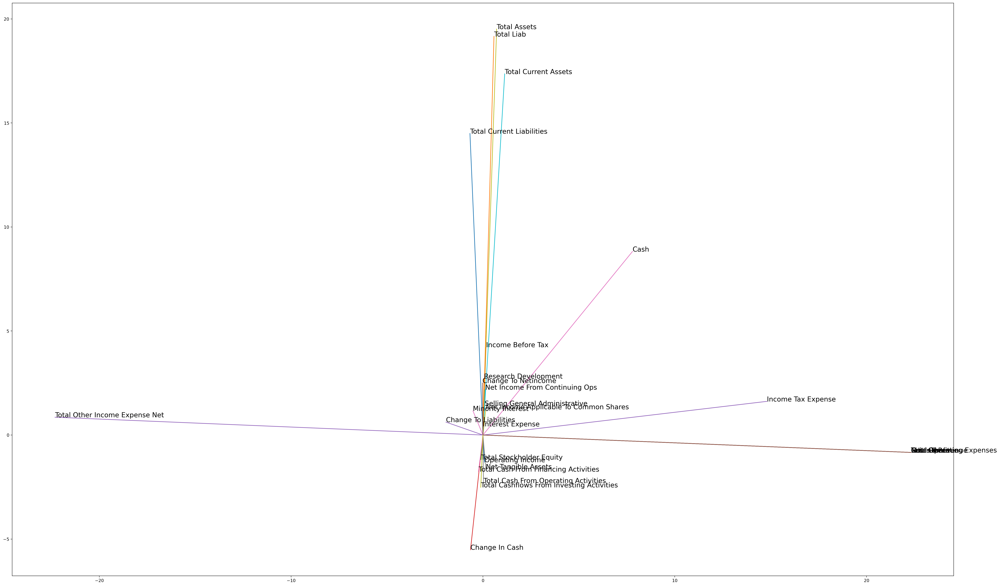

In [45]:
# pc1 = df @ pca[:, 0]
# pc2 = df @ pca[:, 1]

fig, ax = plt.subplots(figsize=(40, 25), dpi=200)
# ax.scatter(pc1, pc2)

# for i, ticker in enumerate(df.index):
#     ax.annotate(ticker, (pc1[i], pc2[i]), fontsize=15)
    
ax.plot([np.zeros(len(pca)), pca[:,0]*s[0]], [np.zeros(len(pca)), pca[:,1]*s[1]])

for i, field in enumerate(df.columns):
    ax.annotate(field, (pca[i,0]*s[0], pca[i,1]*s[1]), fontsize=16)
    
# plt.xlim([-5, 5])
# plt.ylim([-5, 5])

plt.show()
# plt.savefig("image.png",dpi=300)

## Regressing % change against same qtr performance

In [122]:
returns = {}

for ticker, dates in qtr_dates.items():
    start_date = dates[0]
#     end_date = start_date + relativedelta(months=3)
    end_date = dates[1]
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [123]:
dmatrix = df_change @ pca[:, 0:16]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(16), ['pc'+str(i+1) for i in range(16)])), inplace=True)

In [124]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(16)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.024
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.7503
Date:                Wed, 30 Nov 2022   Prob (F-statistic):              0.742
Time:                        02:05:36   Log-Likelihood:                 175.07
No. Observations:                 503   AIC:                            -316.1
Df Residuals:                     486   BIC:                            -244.4
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9839      0.008    126.957      0.000       0.969       0.999
pc1            0.0018      0.003      0.637      0.524      -0.004       0.007
pc2           -0.0036      0.005     -0.785      0.433      -0.013       0.005
pc3            0.0041      0.006      0.716      0.475      -0.007       0.015
pc4           -0.0006      0.006     -0.104      0.917      -0.013       0.012
pc5            0.0029      0.007      0.444      0.657      -0.010       0.016
pc6            0.0011      0.007      0.156      0.876      -0.013       0.015
pc7            0.0028      0.007      0.373      0.709      -0.012       0.017
pc8            0.0032      0.007      0.431      0.667      -0.011       0.018
pc9            0.0175      0.008      2.266      0.024       0.002       0.033
pc10           0.0057      0.008      0.733      0.464      -0.010       0.021
pc11           0.0034      0.008      0.430      0.667      -0.012       0.019
pc12          -0.0107      0.008     -1.339      0.181      -0.026       0.005
pc13          -0.0061      0.008     -0.763      0.446      -0.022       0.010
pc14          -0.0085      0.008     -1.054      0.293      -0.024       0.007
pc15           0.0064      0.008      0.754      0.451      -0.010       0.023
pc16          -0.0001      0.009     -0.011      0.991      -0.018       0.018
==============================================================================
Omnibus:                      111.242   Durbin-Watson:                   1.948
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              334.552
Skew:                           1.038   Prob(JB):                     2.25e-73
Kurtosis:                       6.413   Cond. No.                         3.27
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [130]:
sort_idx = np.argsort(-np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1))
pd.DataFrame(np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1)[sort_idx], index=dmatrix.index[sort_idx]).describe()

,0
count,503.000000
mean,1.188883
std,2.993646
min,0.069172
25%,0.335686
50%,0.683163
75%,1.283538
max,61.122315


In [131]:
sort_idx = np.argsort(-np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1))

drop = pd.DataFrame(np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1)[sort_idx], index=dmatrix.index[sort_idx])[0] > 1

In [132]:
drop.index[drop]

Index(['DTE', 'CDAY', 'CBOE', 'ROP', 'AJG', 'EXC', 'NRG', 'APTV', 'INTU',
       'POOL',
       ...
       'GL', 'CHD', 'COST', 'PNR', 'WTW', 'VNO', 'VTRS', 'MET', 'MHK', 'AAP'],
      dtype='object', length=177)

In [133]:
pca, s = pca_svd(df_change.drop(index=drop.index[drop]))

In [134]:
# variances explained by each principle component
variances = s**2 / sum(s**2)
v = 0
for i in range(1, len(variances)+1):
    v += variances[i-1]
    print('variance explained by pc' + str(i) + ': ' + str(round(variances[i-1], 3)) + ' | ' + str(round(v, 3)))

variance explained by pc1: 0.136 | 0.136
variance explained by pc2: 0.134 | 0.27
variance explained by pc3: 0.13 | 0.4
variance explained by pc4: 0.118 | 0.517
variance explained by pc5: 0.088 | 0.605
variance explained by pc6: 0.085 | 0.69
variance explained by pc7: 0.055 | 0.744
variance explained by pc8: 0.04 | 0.785
variance explained by pc9: 0.038 | 0.822
variance explained by pc10: 0.032 | 0.854
variance explained by pc11: 0.028 | 0.882
variance explained by pc12: 0.025 | 0.907
variance explained by pc13: 0.024 | 0.931
variance explained by pc14: 0.019 | 0.951
variance explained by pc15: 0.016 | 0.967
variance explained by pc16: 0.009 | 0.976
variance explained by pc17: 0.007 | 0.983
variance explained by pc18: 0.006 | 0.989
variance explained by pc19: 0.005 | 0.994
variance explained by pc20: 0.004 | 0.997
variance explained by pc21: 0.002 | 0.999
variance explained by pc22: 0.001 | 1.0
variance explained by pc23: 0.0 | 1.0
variance explained by pc24: 0.0 | 1.0
variance explaine

In [135]:
dmatrix = df_change.drop(index=drop.index[drop]) @ pca[:, 0:12]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(12), ['pc'+str(i+1) for i in range(12)])), inplace=True)

In [136]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(12)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                 -0.019
Method:                 Least Squares   F-statistic:                    0.4983
Date:                Wed, 30 Nov 2022   Prob (F-statistic):              0.915
Time:                        02:09:46   Log-Likelihood:                 139.31
No. Observations:                 326   AIC:                            -252.6
Df Residuals:                     313   BIC:                            -203.4
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9837      0.009    108.645      0.000       0.966       1.002
pc1           -0.0050      0.007     -0.701      0.484      -0.019       0.009
pc2            0.0009      0.007      0.131      0.896      -0.013       0.015
pc3            0.0048      0.007      0.665      0.506      -0.009       0.019
pc4            0.0024      0.008      0.316      0.752      -0.013       0.017
pc5            0.0056      0.009      0.637      0.524      -0.012       0.023
pc6            0.0013      0.009      0.147      0.883      -0.016       0.019
pc7           -0.0163      0.011     -1.455      0.147      -0.038       0.006
pc8           -0.0060      0.013     -0.459      0.647      -0.032       0.020
pc9            0.0031      0.014      0.231      0.818      -0.023       0.030
pc10           0.0167      0.015      1.138      0.256      -0.012       0.046
pc11          -0.0112      0.016     -0.712      0.477      -0.042       0.020
pc12           0.0092      0.017      0.554      0.580      -0.023       0.042
==============================================================================
Omnibus:                       43.402   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               81.561
Skew:                           0.740   Prob(JB):                     1.95e-18
Kurtosis:                       4.953   Cond. No.                         2.33
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [138]:
sort_idx = np.argsort(-np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1))
pd.DataFrame(np.linalg.norm(dmatrix[['pc1', 'pc2']], axis=1)[sort_idx], index=dmatrix.index[sort_idx])

,0
TTWO,21.983614
HBAN,13.435400
CNP,10.543302
HUM,10.256564
WEC,7.754205
...,...
CLX,0.033281
FDS,0.026169
DLTR,0.026044
RF,0.023277


## Regressing % change against future qtr performance

In [119]:
returns = {}

for ticker, dates in qtr_dates.items():
    start_date = dates[1]
    end_date = start_date + relativedelta(months=3)
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [120]:
dmatrix = df_change @ pca[:, 0:16]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(16), ['pc'+str(i+1) for i in range(16)])), inplace=True)

In [121]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(16)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     1.267
Date:                Tue, 29 Nov 2022   Prob (F-statistic):              0.214
Time:                        19:06:19   Log-Likelihood:                 344.53
No. Observations:                 503   AIC:                            -655.1
Df Residuals:                     486   BIC:                            -583.3
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.8730      0.006    157.779      0.000       0.862       0.884
pc1            0.0014      0.002      0.702      0.483      -0.003       0.005
pc2            0.0032      0.003      0.992      0.322      -0.003       0.010
pc3           -0.0027      0.004     -0.678      0.498      -0.011       0.005
pc4            0.0021      0.004      0.478      0.633      -0.007       0.011
pc5            0.0005      0.005      0.109      0.913      -0.009       0.010
pc6            0.0034      0.005      0.674      0.500      -0.007       0.013
pc7            0.0004      0.005      0.076      0.939      -0.010       0.011
pc8            0.0046      0.005      0.851      0.395      -0.006       0.015
pc9            0.0015      0.006      0.279      0.780      -0.009       0.012
pc10          -0.0105      0.006     -1.883      0.060      -0.021       0.000
pc11          -0.0067      0.006     -1.198      0.232      -0.018       0.004
pc12           0.0131      0.006      2.309      0.021       0.002       0.024
pc13          -0.0076      0.006     -1.332      0.184      -0.019       0.004
pc14          -0.0119      0.006     -2.062      0.040      -0.023      -0.001
pc15           0.0014      0.006      0.232      0.817      -0.010       0.013
pc16          -0.0044      0.007     -0.659      0.510      -0.017       0.009
==============================================================================
Omnibus:                       17.093   Durbin-Watson:                   1.964
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               19.502
Skew:                          -0.378   Prob(JB):                     5.82e-05
Kurtosis:                       3.600   Cond. No.                         3.27
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Creating data matrix and doing PCA on single qtr data (2022 Q1)

In [122]:
df = pd.DataFrame(columns=income_statement_fields+balance_sheet_fields+cashflow_fields, index=data.keys())
qtr_dates = {}

for ticker, dfs in data.items():
    date = dfs['cashflow'].columns[np.argmin(abs(pd.to_datetime('2022-04-05') - dfs['cashflow'].columns))]
    qtr_dates[ticker] = date
    df.loc[ticker] = pd.concat([
        dfs['income_statement'].loc[income_statement_fields, date],
        dfs['balance_sheet'].loc[balance_sheet_fields, date],
        dfs['cashflow'].loc[cashflow_fields, date]]).to_dict()
    
df.fillna(0, inplace=True)
# stadard scale data
df = (df - df.mean()) / df.std() 
df

,Cost Of Revenue,Ebit,Gross Profit,Income Before Tax,Income Tax Expense,Interest Expense,Minority Interest,Net Income,Net Income Applicable To Common Shares,Net Income From Continuing Ops,...,Total Current Assets,Total Current Liabilities,Total Liab,Total Stockholder Equity,Change In Cash,Change To Liabilities,Change To Netincome,Total Cash From Financing Activities,Total Cash From Operating Activities,Total Cashflows From Investing Activities
AAPL,4.885460,11.908193,7.170533,8.183325,10.661052,-3.661999,-0.301530,11.568149,8.416929,8.409697,...,0.643761,0.377211,0.801473,1.564510,-2.130794,-6.665139,0.684945,-3.755310,6.296259,-1.454583
MSFT,1.092214,7.951153,5.582512,5.393774,7.071432,-2.474073,-0.301530,7.608560,5.541075,5.536292,...,0.901468,0.157990,0.422634,4.499228,-1.826082,0.054960,0.477374,-2.305835,5.654362,-2.683323
AMZN,6.028168,1.080348,8.501271,-1.743708,-3.445486,-2.307021,-0.301530,-2.226825,-1.602374,-1.601077,...,0.756932,0.429752,0.777243,3.610656,0.039367,-2.531360,3.108279,0.240556,-0.851421,0.355076
GOOGL,2.448718,7.840035,6.423367,5.041610,4.995611,0.099766,-0.301530,7.468956,5.439681,5.434984,...,1.074015,0.090164,0.129532,7.297386,-0.001669,-0.804980,1.164438,-2.156884,5.589711,-1.416508
GOOG,2.448718,7.840035,6.423367,5.041610,4.995611,0.099766,-0.301530,7.468956,5.439681,5.434984,...,1.074015,0.090164,0.129532,7.297386,-0.001669,-0.804980,1.164438,-2.156884,5.589711,-1.416508
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VNO,-0.401501,-0.388199,-0.450616,-0.246882,-0.383435,0.225735,0.216439,-0.389025,-0.258386,-0.267418,...,-0.193827,-0.181068,-0.254946,-0.506121,0.006054,-0.041311,-0.092308,-0.069373,-0.147272,0.207893
DVA,-0.226699,-0.293293,-0.353376,-0.193535,-0.260666,0.165262,0.765284,-0.311515,-0.211283,-0.196045,...,-0.185782,-0.170470,-0.200205,-0.480199,-0.018759,-0.034686,-0.071255,-0.066508,-0.132821,0.172817
NWS,-0.301638,-0.351841,-0.272844,-0.229909,-0.320988,0.489554,0.373872,-0.349821,-0.239105,-0.231335,...,-0.178331,-0.165625,-0.225099,-0.247288,-0.060616,0.024314,-0.074989,0.027468,-0.068676,-0.038313
BRK-B,-0.422505,-0.429624,-0.497336,-15.823524,-0.383435,-6.112095,5.439726,-0.389025,-15.461125,-15.316539,...,-0.208340,-0.181068,-0.254946,-0.506121,-1.901353,-0.041311,20.601905,-0.157964,1.762807,-2.582974


In [123]:
def pca_svd(X):
    # already standardized
#     X = (X - X.mean(axis=0)) / X.std(axis=0)
    
    # calculate SVD
    U, s, Vt = np.linalg.svd(X, full_matrices=False)
    
    return Vt.T, s

In [124]:
pca, s = pca_svd(df)

In [125]:
# variances explained by each principle component
variances = s**2 / sum(s**2)
v = 0
for i in range(1, len(variances)+1):
    v += variances[i-1]
    print('variance explained by pc' + str(i) + ': ' + str(round(variances[i-1], 3)) + ' | ' + str(round(v, 3)))

variance explained by pc1: 0.369 | 0.369
variance explained by pc2: 0.216 | 0.585
variance explained by pc3: 0.122 | 0.707
variance explained by pc4: 0.059 | 0.766
variance explained by pc5: 0.05 | 0.817
variance explained by pc6: 0.042 | 0.859
variance explained by pc7: 0.035 | 0.894
variance explained by pc8: 0.024 | 0.918
variance explained by pc9: 0.019 | 0.937
variance explained by pc10: 0.013 | 0.951
variance explained by pc11: 0.011 | 0.962
variance explained by pc12: 0.009 | 0.971
variance explained by pc13: 0.008 | 0.979
variance explained by pc14: 0.005 | 0.985
variance explained by pc15: 0.004 | 0.988
variance explained by pc16: 0.004 | 0.992
variance explained by pc17: 0.003 | 0.995
variance explained by pc18: 0.002 | 0.997
variance explained by pc19: 0.001 | 0.998
variance explained by pc20: 0.001 | 0.999
variance explained by pc21: 0.001 | 0.999
variance explained by pc22: 0.0 | 1.0
variance explained by pc23: 0.0 | 1.0
variance explained by pc24: 0.0 | 1.0
variance expla

In [126]:
# weights of first principle component
pd.DataFrame(sorted(pca[:, 0], reverse=True), index=df.columns[np.argsort(-pca[:, 0])])

,0
Total Cashflows From Investing Activities,0.199405
Interest Expense,0.071370
Change In Cash,0.047473
Total Other Income Expense Net,0.046573
Change To Netincome,0.008347
Total Cash From Operating Activities,-0.031613
Minority Interest,-0.047478
Change To Liabilities,-0.082066
Total Cash From Financing Activities,-0.106030
Cost Of Revenue,-0.154166


## Regressing financial data against same qtr performance

In [127]:
# get performance for the same qtr of the financial data
returns = {}

for ticker, end_date in qtr_dates.items():
    start_date = end_date - relativedelta(months=3)
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [128]:
returns

{'AAPL': 0.9701247175085722,
 'MSFT': 0.9186117014592492,
 'AMZN': 0.977689750973943,
 'GOOGL': 0.9600661370073883,
 'GOOG': 0.965233508364943,
 'TSLA': 1.0197013633367706,
 'XOM': 1.364693354004983,
 'UNH': 1.0185986317622981,
 'JNJ': 1.0454344702023102,
 'NVDA': 0.7529085322192235,
 'JPM': 0.8660379849182389,
 'V': 1.0250140450823217,
 'CVX': 1.4021266423565648,
 'PG': 0.9391431997589468,
 'HD': 0.8196714287509591,
 'MA': 0.9959060673018908,
 'LLY': 1.0410738370183308,
 'PFE': 0.9172479410206534,
 'ABBV': 1.2096912731309823,
 'META': 0.6610970613210514,
 'BAC': 0.9310302596588543,
 'MRK': 1.080113030715682,
 'PEP': 0.967186098792768,
 'KO': 1.0683180530342702,
 'COST': 0.9674351914091618,
 'TMO': 0.9189849657917021,
 'AVGO': 0.9416570148990696,
 'WMT': 1.098503300958953,
 'MCD': 0.9275770762360842,
 'CSCO': 0.8858526321203223,
 'ACN': 0.8661070398534341,
 'ABT': 0.8439497642899895,
 'WFC': 1.0145390678045019,
 'DHR': 0.9245792664050693,
 'DIS': 0.8739474661950559,
 'COP': 1.396554953

In [129]:
dmatrix = df @ pca[:, 0:7]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(7), ['pc'+str(i+1) for i in range(7)])), inplace=True)

In [130]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(7)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.031
Method:                 Least Squares   F-statistic:                     3.262
Date:                Tue, 29 Nov 2022   Prob (F-statistic):            0.00214
Time:                        19:06:36   Log-Likelihood:                 179.86
No. Observations:                 503   AIC:                            -343.7
Df Residuals:                     495   BIC:                            -309.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9831      0.008    129.255      0.000       0.968       0.998
pc1           -0.0014      0.002     -0.602      0.547      -0.006       0.003
pc2           -0.0044      0.003     -1.450      0.148      -0.010       0.002
pc3            0.0083      0.004      2.062      0.040       0.000       0.016
pc4            0.0003      0.006      0.056      0.956      -0.011       0.012
pc5            0.0127      0.006      2.019      0.044       0.000       0.025
pc6           -0.0145      0.007     -2.100      0.036      -0.028      -0.001
pc7            0.0209      0.008      2.761      0.006       0.006       0.036
==============================================================================
Omnibus:                      120.803   Durbin-Watson:                   1.931
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              398.917
Skew:                           1.094   Prob(JB):                     2.38e-87
Kurtosis:                       6.774   Cond. No.                         3.27
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Regressing financial data against future performance

In [131]:
returns = {}

for ticker, start_date in qtr_dates.items():
    end_date = start_date + relativedelta(months=3)  # 3 months ahead
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [132]:
returns

{'AAPL': 0.8079050694753485,
 'MSFT': 0.8349653506037936,
 'AMZN': 0.6516050901106186,
 'GOOGL': 0.7835259396387605,
 'GOOG': 0.783192873306259,
 'TSLA': 0.6249257238536509,
 'XOM': 1.0475509500586715,
 'UNH': 1.0107686313902149,
 'JNJ': 1.0238204341140709,
 'NVDA': 0.9442942469889156,
 'JPM': 0.8321941750559305,
 'V': 0.8895073327459058,
 'CVX': 0.8964628166379698,
 'PG': 0.9463133662130747,
 'HD': 1.0025454970209076,
 'MA': 0.8839830487901862,
 'LLY': 1.1360221121305945,
 'PFE': 1.0352687970057535,
 'ABBV': 0.9528203974678846,
 'META': 0.7251753892669011,
 'BAC': 0.7595657697615664,
 'MRK': 1.1202455260890622,
 'PEP': 0.9728863471445056,
 'KO': 1.0314162367579265,
 'COST': 1.088217208006932,
 'TMO': 0.9295955305073768,
 'AVGO': 0.938347761483301,
 'WMT': 0.8720225595366654,
 'MCD': 1.0039156676867547,
 'CSCO': 0.9181377317040423,
 'ACN': 0.9653049102080782,
 'ABT': 0.9216209155619942,
 'WFC': 0.812714272514537,
 'DHR': 0.8855723333139415,
 'DIS': 0.6937508884352204,
 'COP': 0.9091326

In [133]:
dmatrix = df @ pca[:, 0:7]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(7), ['pc'+str(i+1) for i in range(7)])), inplace=True)

In [134]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(7)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     2.194
Date:                Tue, 29 Nov 2022   Prob (F-statistic):             0.0335
Time:                        19:06:39   Log-Likelihood:                 340.68
No. Observations:                 503   AIC:                            -665.4
Df Residuals:                     495   BIC:                            -631.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.8732      0.006    158.053      0.000       0.862       0.884
pc1           -0.0011      0.002     -0.652      0.515      -0.004       0.002
pc2           -0.0046      0.002     -2.071      0.039      -0.009      -0.000
pc3            0.0004      0.003      0.122      0.903      -0.005       0.006
pc4           -0.0049      0.004     -1.149      0.251      -0.013       0.003
pc5            0.0127      0.005      2.773      0.006       0.004       0.022
pc6           -0.0058      0.005     -1.161      0.246      -0.016       0.004
pc7            0.0029      0.005      0.522      0.602      -0.008       0.014
==============================================================================
Omnibus:                       15.695   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               18.721
Skew:                          -0.336   Prob(JB):                     8.61e-05
Kurtosis:                       3.665   Cond. No.                         3.27
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

# Calculate % change between 2 quarters (2022 Q1 - 2022 Q2)

In [135]:
df_change = pd.DataFrame(columns=income_statement_fields+balance_sheet_fields+cashflow_fields, index=data.keys())
qtr_dates = {}


for ticker, dfs in data.items():
    idx = np.argmin(abs(pd.to_datetime('2021-04-05') - dfs['cashflow'].columns))
    dates = dfs['cashflow'].columns[[idx, idx-1]]
    qtr_dates[ticker] = dates
    income_statement_df =\
        (dfs['income_statement'].loc[income_statement_fields, dates[1]].replace(0, 1) -\
        dfs['income_statement'].loc[income_statement_fields, dates[0]].replace(0, 1)) /\
        dfs['income_statement'].loc[income_statement_fields, dates[0]].replace(0, 1)
    balance_sheet_df =\
        (dfs['balance_sheet'].loc[balance_sheet_fields, dates[1]].replace(0, 1) -\
        dfs['balance_sheet'].loc[balance_sheet_fields, dates[0]].replace(0, 1)) /\
        dfs['balance_sheet'].loc[balance_sheet_fields, dates[0]].replace(0, 1)
    cashflow_df =\
        (dfs['cashflow'].loc[cashflow_fields, dates[1]].replace(0, 1) -\
        dfs['cashflow'].loc[cashflow_fields, dates[0]].replace(0, 1)) /\
        dfs['cashflow'].loc[cashflow_fields, dates[0]].replace(0, 1)
    
    df_change.loc[ticker] = pd.concat([
        income_statement_df,
        balance_sheet_df,
        cashflow_df]).to_dict()
    
df_change.fillna(0, inplace=True)
df_change = (df_change - df_change.mean()) / df_change.std()
df_change

,Cost Of Revenue,Ebit,Gross Profit,Income Before Tax,Income Tax Expense,Interest Expense,Minority Interest,Net Income,Net Income Applicable To Common Shares,Net Income From Continuing Ops,...,Total Current Assets,Total Current Liabilities,Total Liab,Total Stockholder Equity,Change In Cash,Change To Liabilities,Change To Netincome,Total Cash From Financing Activities,Total Cash From Operating Activities,Total Cashflows From Investing Activities
AAPL,-0.044588,-0.044588,-0.044588,-0.142846,0.026254,-0.125251,-0.039671,-0.044588,-0.143042,-0.060868,...,-0.951109,-0.131035,-0.749051,-0.297232,-0.016314,-0.126641,-0.057336,-0.059721,-0.035805,-0.012741
MSFT,-0.044588,-0.044588,-0.044588,-0.095509,0.026254,-0.155310,-0.039671,-0.044588,-0.055661,-0.001895,...,-0.509332,-0.062085,-0.117072,-0.094221,-0.025531,-0.126641,-0.043084,-0.053121,0.060562,0.563332
AMZN,-0.044588,-0.044588,-0.044588,-0.451918,0.026253,-0.138276,-0.039671,-0.044588,-0.654493,-0.406045,...,-0.726691,-0.071514,-0.302927,-0.216460,-0.001121,-0.126641,-0.160200,-0.084435,-0.096462,-0.040665
GOOGL,-0.044588,-0.044588,-0.044588,-0.129975,0.026254,-0.352279,-0.039671,-0.044588,-0.104817,-0.035070,...,-0.266173,-0.079939,-0.459194,-0.116207,-0.001113,-0.126641,-0.026032,-0.060092,-0.001786,-0.002113
GOOG,-0.044588,-0.044588,-0.044588,-0.129975,0.026254,-0.352279,-0.039671,-0.044588,-0.104817,-0.035070,...,-0.266173,-0.079939,-0.459194,-0.116207,-0.001113,-0.126641,-0.026032,-0.060092,-0.001786,-0.002113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VNO,-0.044588,-0.044588,-0.044588,-0.092930,0.026254,-0.067076,-0.046464,-0.044588,-0.361625,-0.157329,...,-0.489685,0.148156,-0.066343,-0.168052,0.028486,-0.126641,-0.071474,-0.121517,4.308262,-0.008744
DVA,-0.044588,-0.044588,-0.044588,-0.123559,0.026254,-0.130047,-0.033566,-0.044588,-0.143286,-0.040703,...,-0.740558,-0.053952,-0.228182,-0.996259,0.035934,-0.126650,-0.053646,-0.049804,-0.007824,0.050711
NWS,-0.044588,-0.044588,-0.044588,-0.046637,0.026255,0.366204,-0.018382,-0.044588,0.103122,0.029406,...,0.154310,-0.067702,-0.259488,-0.087072,-0.003872,-0.126641,-2.740732,-0.054885,0.358849,0.032375
BRK-B,-0.044588,-0.044588,-0.044588,-0.674658,0.026254,-0.044120,-0.066678,-0.044588,-1.085749,-0.691359,...,-0.050467,-0.061617,-0.167119,-0.139735,-0.003222,-0.126641,-0.202156,-0.072639,0.005536,-0.076453


In [136]:
pca, s = pca_svd(df_change)

In [137]:
# variances explained by each principle component
variances = s**2 / sum(s**2)
v = 0
for i in range(1, len(variances)+1):
    v += variances[i-1]
    print('variance explained by pc' + str(i) + ': ' + str(round(variances[i-1], 3)) + ' | ' + str(round(v, 3)))

variance explained by pc1: 0.247 | 0.247
variance explained by pc2: 0.117 | 0.364
variance explained by pc3: 0.05 | 0.414
variance explained by pc4: 0.046 | 0.461
variance explained by pc5: 0.041 | 0.502
variance explained by pc6: 0.038 | 0.54
variance explained by pc7: 0.038 | 0.578
variance explained by pc8: 0.035 | 0.613
variance explained by pc9: 0.035 | 0.648
variance explained by pc10: 0.034 | 0.682
variance explained by pc11: 0.034 | 0.716
variance explained by pc12: 0.033 | 0.749
variance explained by pc13: 0.033 | 0.782
variance explained by pc14: 0.031 | 0.813
variance explained by pc15: 0.03 | 0.843
variance explained by pc16: 0.029 | 0.871
variance explained by pc17: 0.028 | 0.899
variance explained by pc18: 0.027 | 0.926
variance explained by pc19: 0.023 | 0.949
variance explained by pc20: 0.021 | 0.97
variance explained by pc21: 0.017 | 0.987
variance explained by pc22: 0.011 | 0.998
variance explained by pc23: 0.002 | 1.0
variance explained by pc24: 0.0 | 1.0
variance ex

In [138]:
# weights of first principle component
pd.DataFrame(sorted(pca[:, 0], reverse=True), index=df.columns[np.argsort(-pca[:, 0])])

,0
Net Income,0.372802
Ebit,0.372802
Gross Profit,0.372802
Total Revenue,0.372802
Cost Of Revenue,0.372802
Total Operating Expenses,0.372802
Income Tax Expense,0.142835
Cash,0.077705
Total Current Assets,0.016023
Total Assets,0.009184


## Regressing % change against same qtr performance

In [139]:
returns = {}

for ticker, dates in qtr_dates.items():
    start_date = dates[0]
#     end_date = start_date + relativedelta(months=3)
    end_date = dates[1]
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [140]:
returns

{'AAPL': 0.9701247175085722,
 'MSFT': 0.9186117014592492,
 'AMZN': 0.977689750973943,
 'GOOGL': 0.9600661370073883,
 'GOOG': 0.965233508364943,
 'TSLA': 1.0197013633367706,
 'XOM': 1.364693354004983,
 'UNH': 1.0185986317622981,
 'JNJ': 1.0454344702023102,
 'NVDA': 0.7575823033495052,
 'JPM': 0.8660379849182389,
 'V': 1.0250140450823217,
 'CVX': 1.4021266423565648,
 'PG': 0.9391431997589468,
 'HD': 0.8235131918747594,
 'MA': 0.9959060673018908,
 'LLY': 1.0410738370183308,
 'PFE': 0.8799677522975191,
 'ABBV': 1.2096912731309823,
 'META': 0.6610970613210514,
 'BAC': 0.9310302596588543,
 'MRK': 1.080113030715682,
 'PEP': 1.0067075713190905,
 'KO': 1.0699418736765167,
 'COST': 0.9458769879480085,
 'TMO': 0.8882438882925437,
 'AVGO': 1.0674802210804721,
 'WMT': 0.9371312839685525,
 'MCD': 0.9275770762360842,
 'CSCO': 0.9971068222412188,
 'ACN': 0.8865116728338313,
 'ABT': 0.8439497642899895,
 'WFC': 1.0145390678045019,
 'DHR': 0.8873442715298615,
 'DIS': 0.8929435800446435,
 'COP': 1.0744448

In [141]:
dmatrix = df_change @ pca[:, 0:16]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(16), ['pc'+str(i+1) for i in range(16)])), inplace=True)

In [142]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(16)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.031
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.9710
Date:                Tue, 29 Nov 2022   Prob (F-statistic):              0.487
Time:                        19:06:48   Log-Likelihood:                 228.42
No. Observations:                 503   AIC:                            -422.8
Df Residuals:                     486   BIC:                            -351.1
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0248      0.007    147.030      0.000       1.011       1.038
pc1            0.0016      0.003      0.626      0.531      -0.003       0.007
pc2           -0.0009      0.004     -0.230      0.818      -0.008       0.007
pc3           -0.0085      0.006     -1.481      0.139      -0.020       0.003
pc4            0.0054      0.006      0.900      0.369      -0.006       0.017
pc5           -0.0003      0.006     -0.051      0.959      -0.013       0.012
pc6           -0.0149      0.007     -2.248      0.025      -0.028      -0.002
pc7            0.0006      0.007      0.092      0.927      -0.013       0.014
pc8           -0.0016      0.007     -0.234      0.815      -0.015       0.012
pc9           -0.0088      0.007     -1.263      0.207      -0.022       0.005
pc10           0.0059      0.007      0.841      0.401      -0.008       0.020
pc11           0.0029      0.007      0.413      0.680      -0.011       0.017
pc12          -0.0103      0.007     -1.448      0.148      -0.024       0.004
pc13           0.0066      0.007      0.920      0.358      -0.007       0.021
pc14          -0.0065      0.007     -0.876      0.382      -0.021       0.008
pc15           0.0044      0.008      0.590      0.555      -0.010       0.019
pc16          -0.0051      0.008     -0.662      0.509      -0.020       0.010
==============================================================================
Omnibus:                       33.093   Durbin-Watson:                   1.868
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               52.125
Skew:                           0.475   Prob(JB):                     4.80e-12
Kurtosis:                       4.259   Cond. No.                         2.94
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Regressing % change against future qtr performance

In [143]:
returns = {}

for ticker, dates in qtr_dates.items():
    start_date = dates[1]
    end_date = start_date + relativedelta(months=3)
    dret = all_daily_returns.loc[start_date:end_date, ticker] + 1
    dret.iloc[0] = 1
    cumret = dret.cumprod()
    returns[ticker] = cumret.iloc[-1]
    


In [144]:
returns

{'AAPL': 0.8079050694753485,
 'MSFT': 0.8349653506037936,
 'AMZN': 0.6516050901106186,
 'GOOGL': 0.7835259396387605,
 'GOOG': 0.783192873306259,
 'TSLA': 0.6249257238536509,
 'XOM': 1.0475509500586715,
 'UNH': 1.0107686313902149,
 'JNJ': 1.0238204341140709,
 'NVDA': 0.9442942469889156,
 'JPM': 0.8321941750559305,
 'V': 0.8895073327459058,
 'CVX': 0.8964628166379698,
 'PG': 0.9463133662130747,
 'HD': 1.0025454970209076,
 'MA': 0.8839830487901862,
 'LLY': 1.1360221121305945,
 'PFE': 1.0352687970057535,
 'ABBV': 0.9528203974678846,
 'META': 0.7251753892669011,
 'BAC': 0.7595657697615664,
 'MRK': 1.1202455260890622,
 'PEP': 1.0916745786091284,
 'KO': 1.0314162367579265,
 'COST': 0.9832577089349849,
 'TMO': 0.9295955305073768,
 'AVGO': 0.9526506642722993,
 'WMT': 1.098503300958953,
 'MCD': 1.0039156676867547,
 'CSCO': 0.8858526321203223,
 'ACN': 0.9653049102080782,
 'ABT': 0.9216209155619942,
 'WFC': 0.812714272514537,
 'DHR': 0.8855723333139415,
 'DIS': 0.8739474661950559,
 'COP': 1.396554

In [145]:
dmatrix = df_change @ pca[:, 0:16]
dmatrix['performance'] = returns
dmatrix.rename(columns=dict(zip(range(16), ['pc'+str(i+1) for i in range(16)])), inplace=True)

In [146]:
import statsmodels.formula.api as smf

# Initialise and fit linear regression model using `statsmodels`
model = smf.ols('performance ~ '+' + '.join(['pc'+str(i+1) for i in range(16)]), data=dmatrix).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            performance   R-squared:                       0.043
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     1.349
Date:                Tue, 29 Nov 2022   Prob (F-statistic):              0.163
Time:                        19:06:51   Log-Likelihood:                 197.47
No. Observations:                 503   AIC:                            -360.9
Df Residuals:                     486   BIC:                            -289.2
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.9378      0.007    126.519      0.000       0.923       0.952
pc1            0.0007      0.003      0.251      0.802      -0.005       0.006
pc2           -0.0113      0.004     -2.806      0.005      -0.019      -0.003
pc3            0.0022      0.006      0.359      0.720      -0.010       0.014
pc4           -0.0018      0.006     -0.283      0.777      -0.014       0.011
pc5           -0.0141      0.007     -2.074      0.039      -0.027      -0.001
pc6           -0.0104      0.007     -1.471      0.142      -0.024       0.003
pc7            0.0005      0.007      0.070      0.944      -0.013       0.014
pc8           -0.0031      0.007     -0.424      0.671      -0.017       0.011
pc9           -0.0045      0.007     -0.606      0.545      -0.019       0.010
pc10           0.0131      0.007      1.764      0.078      -0.001       0.028
pc11          -0.0060      0.007     -0.807      0.420      -0.021       0.009
pc12           0.0055      0.008      0.730      0.466      -0.009       0.020
pc13          -0.0062      0.008     -0.815      0.415      -0.021       0.009
pc14           0.0035      0.008      0.452      0.651      -0.012       0.019
pc15          -0.0064      0.008     -0.793      0.428      -0.022       0.009
pc16          -0.0064      0.008     -0.789      0.430      -0.022       0.010
==============================================================================
Omnibus:                      122.450   Durbin-Watson:                   2.073
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              462.966
Skew:                           1.062   Prob(JB):                    2.94e-101
Kurtosis:                       7.193   Cond. No.                         2.94
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""